In [3]:
# pip install tensorflow

     |████████████████████████████████| 320.4 MB 16 kB/s s eta 0:00:01
     |████████████████████████████████| 10.6 MB 53.1 MB/s eta 0:00:01
     |████████████████████████████████| 65 kB 380 kB/s  eta 0:00:01
     |████████████████████████████████| 459 kB 58.8 MB/s eta 0:00:01
     |████████████████████████████████| 3.8 MB 59.1 MB/s eta 0:00:01
     |████████████████████████████████| 127 kB 65.4 MB/s eta 0:00:01
     |████████████████████████████████| 42 kB 112 kB/s  eta 0:00:01
     |████████████████████████████████| 114 kB 70.3 MB/s eta 0:00:01
     |████████████████████████████████| 779 kB 50.2 MB/s eta 0:00:01
     |████████████████████████████████| 96 kB 590 kB/s  eta 0:00:01
     |████████████████████████████████| 155 kB 67.9 MB/s eta 0:00:01
     |████████████████████████████████| 147 kB 68.7 MB/s eta 0:00:01
  Created wheel for termcolor: filename=termcolor-1.1.0-py3-none-any.whl size=4830 sha256=d0dcb83078d4ec5883417a3507983352b43ac65cd71da455b61f11ffd2db2400
  Stored in direc

In [1]:
pip install matplotlib

  Using cached matplotlib-3.3.3-cp36-cp36m-manylinux1_x86_64.whl (11.6 MB)
  Using cached cycler-0.10.0-py2.py3-none-any.whl (6.5 kB)
  Using cached kiwisolver-1.3.1-cp36-cp36m-manylinux1_x86_64.whl (1.1 MB)
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install seaborn

  Using cached seaborn-0.11.0-py3-none-any.whl (283 kB)
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
cd ..

In [3]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import *

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Model
from tensorflow.keras import layers

In [4]:
train_path = 'images/fullsplit/train'
valid_path = 'images/fullsplit/test'
test_path = 'images/fullsplit/val'

In [5]:
os.path.exists(train_path)

True

In [6]:
ls images/fullsplit/train

 André_Derain/     George_Condo/          Paul_Cézanne/
 Caravaggio/       Henri_Matisse/        'Pierre-Auguste Renoir'/
 Claude_Monet/     Keith_Haring/          Rembrant_Van_Rijn/
 Edouard_Manet/    Maurice_de_Vlaminck/   Van_Gogh/
 Francisco_Goya/   Michelangelo/


In [7]:
classlist = ['André_Derain','Caravaggio','Claude_Monet','Edouard_Manet','Francisco_Goya','George_Condo','Henri_Matisse','Keith_Haring','Maurice_de_Vlaminck','Michelangelo','Paul_Cézanne','Pierre-Auguste Renoir','Rembrant_Van_Rijn','Van_Gogh']
#classlist = ['Claude_Monet', 'Paul_Cézanne', 'francisco_goya', 'van_gogh', 'Henri_Matisse', 'andré_derain', 'michelangelo', 'édouard_manet']
batch_size = 10

In [8]:
AugmentGenerator = ImageDataGenerator(rescale = 1./255.,
                                      rotation_range = 40,
                                      width_shift_range = 0.2,
                                      height_shift_range = 0.2,
                                      shear_range = 0.2,
                                      zoom_range = 0.2,
                                      horizontal_flip = True)

aug_batches = AugmentGenerator.flow_from_directory(train_path,
                                                   target_size=(224, 224),
                                                   classes=classlist,
                                                   batch_size=batch_size)

Found 3017 images belonging to 14 classes.


In [10]:
train_batches =  ImageDataGenerator().flow_from_directory(train_path,
                                                          target_size=(224, 224),
                                                          classes=classlist,
                                                          batch_size=batch_size)

valid_batches = ImageDataGenerator().flow_from_directory(valid_path,
                                                         target_size=(224, 224),
                                                         classes=classlist,
                                                         batch_size=batch_size)

test_batches = ImageDataGenerator().flow_from_directory(test_path,
                                                        target_size=(224, 224),
                                                        classes=classlist,
                                                        batch_size=batch_size)

Found 3017 images belonging to 14 classes.
Found 614 images belonging to 14 classes.
Found 396 images belonging to 14 classes.


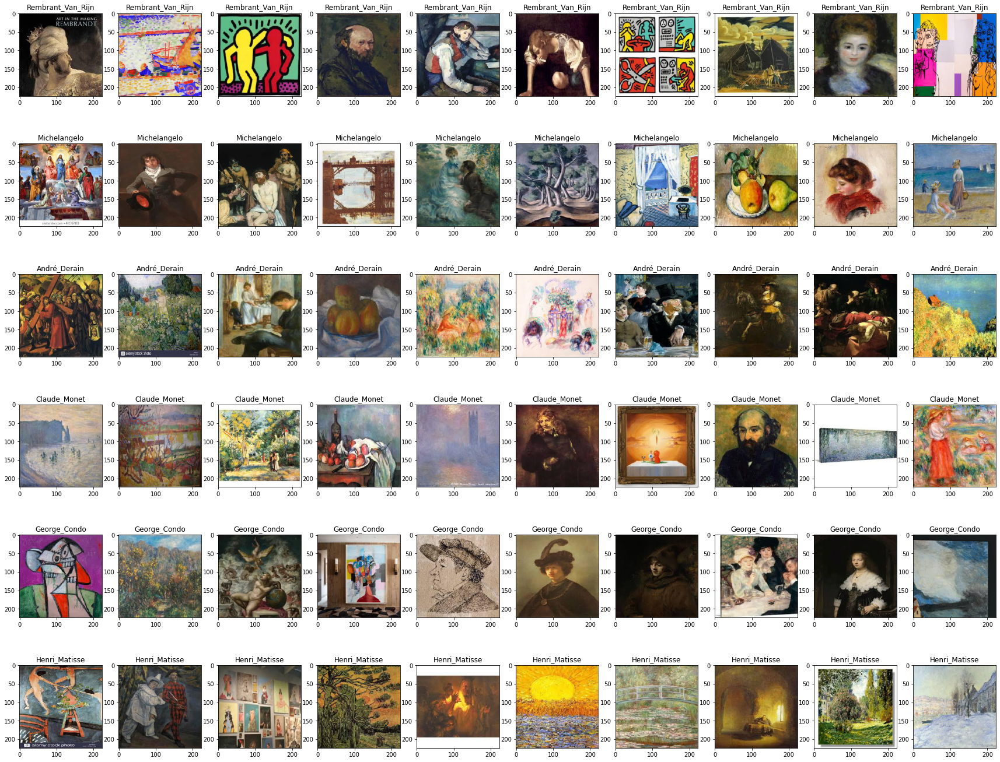

In [11]:
def image_plot(rows, batch, cols=batch_size, classlist=classlist):   
    
    fig, axs = plt.subplots(rows,cols,figsize=(cols*3,rows*4))

    for i in range(rows):
        
        images, labels = next(batch)
        
        for j, pic in enumerate(images):
            if rows > 1:
                axs[i,j].imshow(pic/255)
                axs[i,j].set_title(classlist[labels.argmax()])
            
            else:
                axs[j].imshow(pic/255)
                axs[j].set_title(classlist[labels.argmax()])

image_plot(rows=6, batch=train_batches)

In [12]:
from tensorflow.keras.applications.vgg19 import VGG19

In [13]:
vgg19_model = VGG19(input_shape = (224, 224, 3),
                    include_top = True,
                    weights = 'imagenet')

In [14]:
for layer in vgg19_model.layers[:]:
    layer.trainable = False

In [15]:
Modelx = Sequential()
for layer in vgg19_model.layers[:-1]:
    Modelx.add(layer)

In [16]:
num_classes = len(classlist)
Modelx.add(layers.Dense(num_classes, activation='softmax'))

In [17]:
Modelx.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       2

In [20]:
RMS =  tf.keras.optimizers.RMSprop(lr=0.0001)
SGD = tf.keras.optimizers.SGD(learning_rate=0.01)

Modelx.compile(optimizer = SGD,
               loss = 'categorical_crossentropy',
               metrics = ['accuracy'])

In [19]:
Modelx.fit(train_batches, validation_data=valid_batches, epochs=25, verbose=1)

  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


Train for 302 steps, validate for 62 steps
Epoch 1/25
302/302 [==============================] - 52s 173ms/step - loss: 3.0254 - accuracy: 0.4074 - val_loss: 3.1668 - val_accuracy: 0.4104
Epoch 2/25
302/302 [==============================] - 29s 95ms/step - loss: 1.6287 - accuracy: 0.6112 - val_loss: 5.0523 - val_accuracy: 0.3160
Epoch 3/25
302/302 [==============================] - 28s 94ms/step - loss: 1.1879 - accuracy: 0.6845 - val_loss: 2.4935 - val_accuracy: 0.5163
Epoch 4/25
302/302 [==============================] - 29s 95ms/step - loss: 0.8334 - accuracy: 0.7570 - val_loss: 2.2249 - val_accuracy: 0.5521
Epoch 5/25
302/302 [==============================] - 29s 94ms/step - loss: 0.5571 - accuracy: 0.8223 - val_loss: 1.9133 - val_accuracy: 0.5863
Epoch 6/25
302/302 [==============================] - 28s 94ms/step - loss: 0.3731 - accuracy: 0.8807 - val_loss: 1.6999 - val_accuracy: 0.5945
Epoch 7/25
302/302 [==============================] - 28s 92ms/step - loss: 0.2595 - accurac

In [21]:
def image_plot_predict(rows, batch, model, cols=batch_size, classlist=classlist):   
    
    fig, axs = plt.subplots(rows,cols,figsize=(cols*3,rows*4))

    for i in range(rows):
        
        images, labels = next(batch)
        predictions = model.predict(images)
        
        for j, pic in enumerate(images):
            
            title = 'predict' + ' ' + \
            classlist[predictions[j].argmax()] + ' ' + \
            '\n' + \
            'actual' + ' ' + \
            classlist[labels[j].argmax()]
            
            if rows > 1:
                axs[i,j].imshow(pic/255)
                axs[i,j].set_title(title)
            
            else:
                axs[j].imshow(pic/255)
                axs[j].set_title(title)

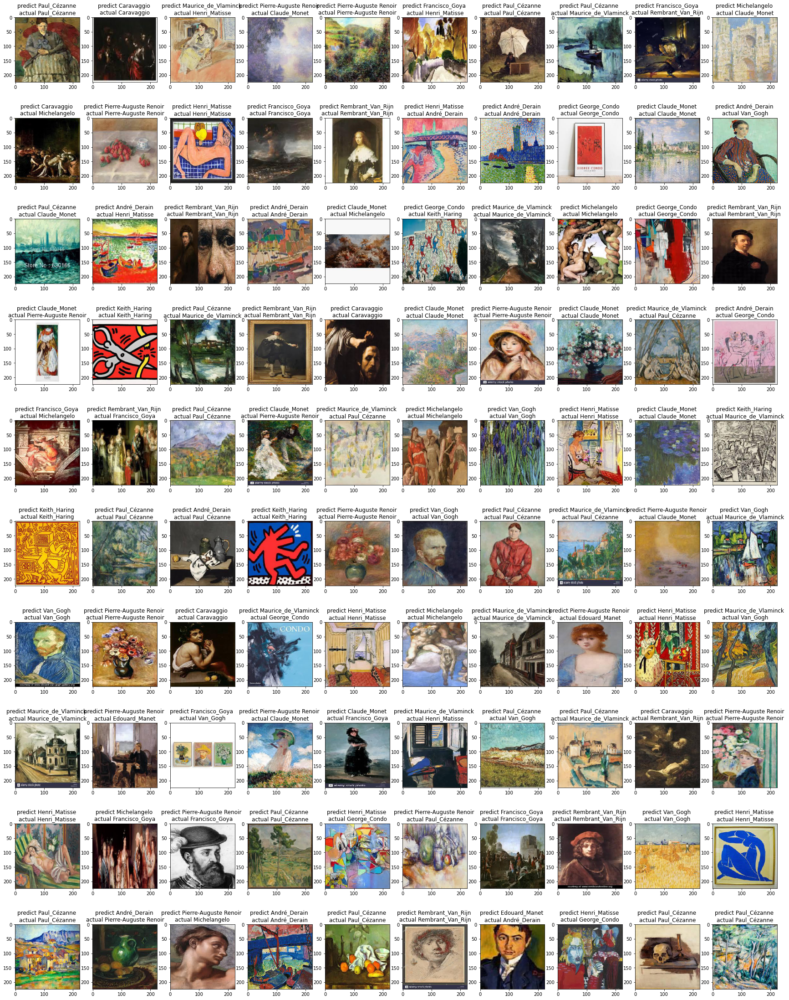

In [22]:
image_plot_predict(rows=10, batch=test_batches, model=Modelx)

In [33]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(vgg19_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Add a final sigmoid layer for classification
x = layers.Dense(num_classes, activation='softmax')(x)

model1 = tf.keras.models.Model(vgg19_model.input, x)

RMS =  tf.keras.optimizers.RMSprop(lr=0.0001)

model1.compile(optimizer = RMS,
               loss = 'categorical_crossentropy',
               metrics = ['accuracy'])

In [23]:
def result(test_gen, model):
    pred_, actual_  = [], []  
    r = round(test_batches.n / test_batches.batch_size)

    for i in range(r):
        
        images, labels = next(test_gen)
        predictions = model.predict(images)
        
        for j, label in enumerate(labels):
            
            actual_.append(label.argmax())
            pred_.append(predictions[j].argmax())
            
    return pred_, actual_

In [24]:
test_batches.class_indices, test_batches.n

({'André_Derain': 0,
  'Caravaggio': 1,
  'Claude_Monet': 2,
  'Edouard_Manet': 3,
  'Francisco_Goya': 4,
  'George_Condo': 5,
  'Henri_Matisse': 6,
  'Keith_Haring': 7,
  'Maurice_de_Vlaminck': 8,
  'Michelangelo': 9,
  'Paul_Cézanne': 10,
  'Pierre-Auguste Renoir': 11,
  'Rembrant_Van_Rijn': 12,
  'Van_Gogh': 13},
 396)

In [25]:
pred, actual = result(test_batches, Modelx)

In [26]:
len(pred)

396

<AxesSubplot:>

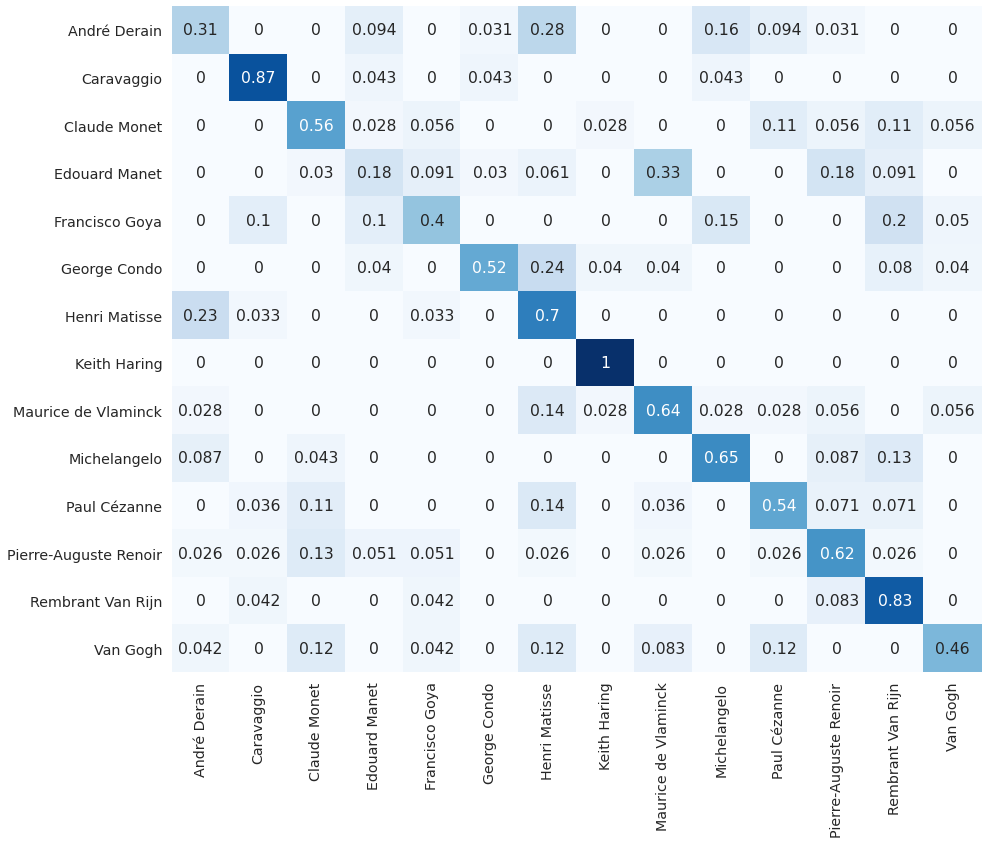

In [37]:
plt.figure(figsize=(14,12), tight_layout=True, frameon=True)

confusion = confusion_matrix(actual, pred, normalize='true')

classname = [string.replace('_', ' ') for string in classlist]

sns.set(font_scale=1.3)

sns.heatmap(confusion, annot=True, yticklabels=name, xticklabels=classname, cbar=False, cmap='Blues')

In [39]:
def missed(test_gen, model, classlist=classlist):

    wrong, ximages, correct = [], [], []
    r = round(test_gen.n / test_gen.batch_size)
    idx = 0
    
    for i in range(r):
    
        images, labels = next(test_gen)
        predictions = model.predict(images)
    
        for j, label in enumerate(labels):
            idx += 1
    
            actual_ = label.argmax()
            pred_ = predictions[j].argmax()    
    
            if actual_ != pred_:
                correct.append(classlist[actual_].replace('_', ' '))
                wrong.append(classlist[pred_].replace('_', ' '))
                ximages.append(images[j])
                
    return wrong, ximages, correct

In [40]:
wrong, ximages, correct = missed(test_batches, Modelx)

In [41]:
len(wrong), len(ximages), len(correct)

(175, 175, 175)

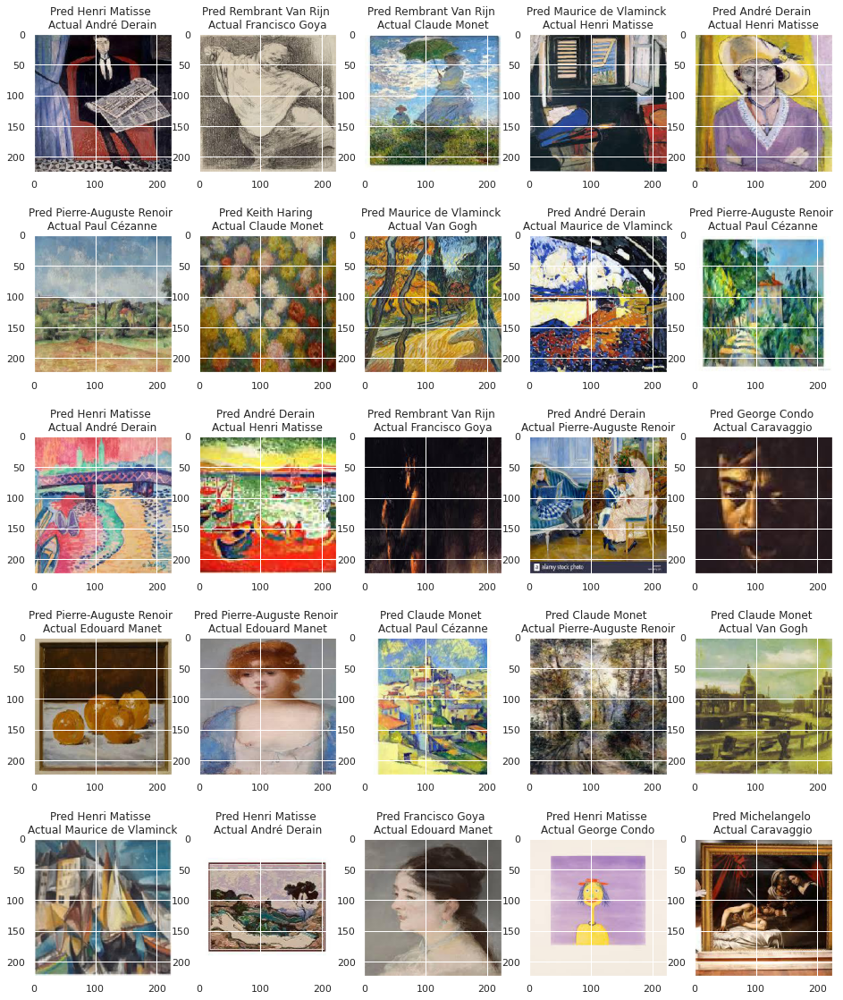

In [46]:
fig, axs = plt.subplots(5, 5, figsize=(16, 20))

sns.set(font_scale=1)

k = 75
for i in range(5):
    for j in range(5):
        axs[i,j].imshow(ximages[k]/255)
        title = f"Pred {wrong[k]} \nActual {correct[k]}"
        axs[i,j].set_title(title)
        k+=1

In [47]:
from sklearn.metrics import classification_report

In [48]:
metrics = classification_report(np.array(actual),
                                np.array(pred),
                                labels = np.unique(actual),
                                target_names=name,
                                output_dict=True)

In [49]:
metrics_df = pd.DataFrame(metrics).T.iloc[:-3,:2]
metrics_df

,precision,recall
André Derain,0.454545,0.312500
Caravaggio,0.769231,0.869565
Claude Monet,0.606061,0.555556
Edouard Manet,0.375000,0.181818
Francisco Goya,0.444444,0.400000
George Condo,0.812500,0.520000
Henri Matisse,0.411765,0.700000
Keith Haring,0.884615,1.000000
Maurice de Vlaminck,0.589744,0.638889
Michelangelo,0.600000,0.652174


In [54]:
len(np.arange(0,27,2))

14

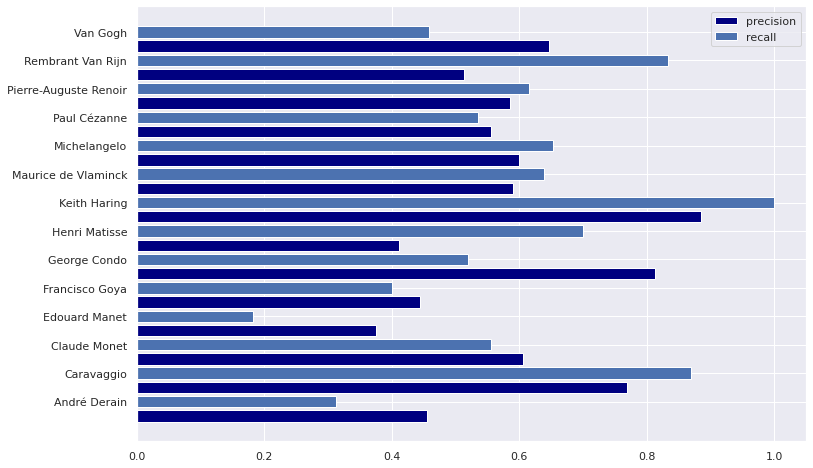

In [55]:
plt.figure(figsize=(12,8))
plt.barh(np.arange(0,27,2), metrics_df.precision, color='navy')
plt.barh(np.arange(1,28,2), metrics_df.recall)
plt.yticks(ticks=np.arange(1,28,2), labels=name)
plt.legend(['precision','recall'])

In [57]:
Modelx.save('Art14_Classifier_VGG19_model.h5')

In [58]:
from tensorflow.keras.applications.vgg16 import VGG16

vgg16_model = VGG16(input_shape = (224, 224, 3),
                    include_top = False,
                    weights = 'imagenet')

for layer in vgg16_model.layers[:]:
    layer.trainable = False

In [59]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(vgg16_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)

# Add a dropout rate of 0.25
x = layers.Dropout(0.25)(x)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)

# Add a dropout rate of 0.25
x = layers.Dropout(0.25)(x)

# Add a final sigmoid layer for classification
x = layers.Dense(num_classes, activation='softmax')(x)

modely = tf.keras.models.Model(vgg16_model.input, x)

SGD = tf.keras.optimizers.SGD(learning_rate=0.001)

modely.compile(optimizer = SGD,
               loss = 'categorical_crossentropy',
               metrics = ['accuracy'])

In [60]:
modely.fit(train_batches, validation_data=valid_batches, epochs=25, verbose=1)

  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


  ...
    to  
  ['...']


Train for 302 steps, validate for 62 steps
Epoch 1/25
302/302 [==============================] - 29s 95ms/step - loss: 6.5294 - accuracy: 0.2930 - val_loss: 2.0312 - val_accuracy: 0.4577
Epoch 2/25
302/302 [==============================] - 29s 95ms/step - loss: 1.3564 - accuracy: 0.6381 - val_loss: 1.8458 - val_accuracy: 0.5000
Epoch 3/25
302/302 [==============================] - 28s 94ms/step - loss: 0.7533 - accuracy: 0.7839 - val_loss: 1.8169 - val_accuracy: 0.5358
Epoch 4/25
302/302 [==============================] - 28s 93ms/step - loss: 0.4403 - accuracy: 0.8740 - val_loss: 1.9058 - val_accuracy: 0.5505
Epoch 5/25
302/302 [==============================] - 29s 95ms/step - loss: 0.2799 - accuracy: 0.9151 - val_loss: 1.8029 - val_accuracy: 0.5423
Epoch 6/25
302/302 [==============================] - 28s 93ms/step - loss: 0.2176 - accuracy: 0.9367 - val_loss: 1.8537 - val_accuracy: 0.5684
Epoch 7/25
302/302 [==============================] - 28s 94ms/step - loss: 0.1776 - accuracy

In [61]:
Modelx.save('Art14_Classifier_VGG16_model.h5')